In [ ]:
import keras
from keras.datasets import cifar10


In [ ]:
(x_train,y_train) ,(x_test , y_test) = cifar10.load_data()
print(x_train.shape)
print(x_test.shape)

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
(50000, 32, 32, 3)
(10000, 32, 32, 3)


In [ ]:
print(" Training %d examples" % len(x_train))
print(" Testing %d examples" % len(x_test))

 Training 50000 examples
 Testing 10000 examples


In [ ]:
x_train.shape

(50000, 32, 32, 3)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm
import numpy as np

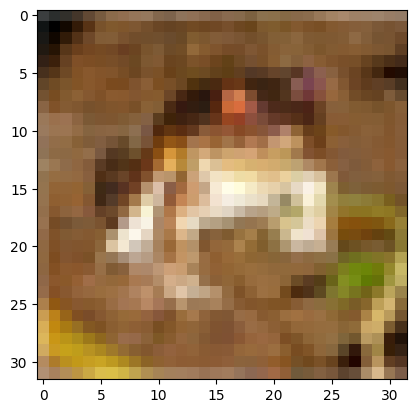

In [ ]:
plt.imshow(x_train[0],cmap='gray')

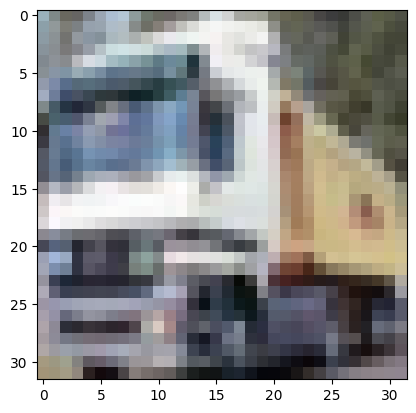

In [ ]:
plt.imshow(x_train[1],cmap='gray')

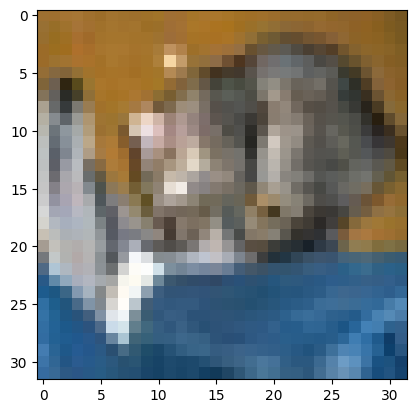

In [ ]:
plt.imshow(x_test[0],cmap='gray')

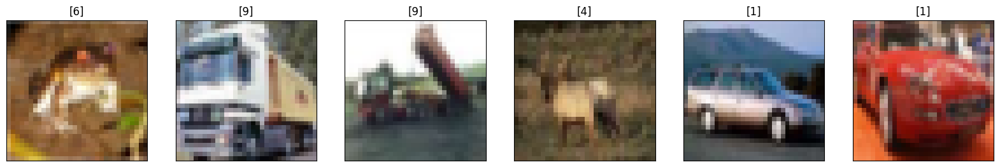

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm
import numpy as np
fig = plt.figure(figsize=(20,20))
for i in range(6):
  ax = fig.add_subplot(1, 6, i+1, xticks=[], yticks=[])
  ax.imshow(x_train[i], cmap='gray')
  ax.set_title(str(y_train[i]))

preprocessing technique

In [ ]:
x_train = x_train.astype('float32')/255
x_test = x_test.astype('float32')/255

In [ ]:
x_train[0].max()

np.float32(1.0)

In [ ]:
np.unique(y_train)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

In [ ]:
from tensorflow.keras.utils import to_categorical

In [ ]:
num_classes = len(np.unique(y_train))
print(num_classes)

10


In [ ]:
y_train = to_categorical(y_train,num_classes)
y_test = to_categorical(y_test,num_classes)

In [ ]:
y_train.shape

(50000, 10)

In [ ]:
x_train.shape

(50000, 32, 32, 3)

In [ ]:
x_test.shape

(10000, 32, 32, 3)

In [ ]:
img_rows,img_cols=32,32
x_train=x_train.reshape(x_train.shape[0],32,32,3)
x_test= x_test.reshape(10000,32,32,3)
print(x_train.shape)
print(x_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)


In [ ]:
from keras import Sequential
from keras.layers import Dense,Dropout
from keras.callbacks import EarlyStopping,ModelCheckpoint

In [ ]:
early_stopping = EarlyStopping(
    monitor = 'val_accuracy',
    patience = 5,
    verbose = 1,
    restore_best_weights = True
)

In [ ]:
checkpoint = ModelCheckpoint(
    'best_model.keras',
    monitor = 'val_accuracy',
    verbose = 1,
    save_best_only = True
)

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

model = Sequential()
model.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(32,32,3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(10, activation='softmax'))  # No Dropout after softmax

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 357,706 (1.36 MB)

 Trainable params: 357,258 (1.36 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
model.fit(x_train,y_train,batch_size=100,epochs=20,verbose=1,callbacks=[early_stopping,checkpoint],validation_data=(x_test,y_test),validation_split=0.4)

Epoch 1/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.3701 - loss: 2.0373
Epoch 1: val_accuracy improved from -inf to 0.54970, saving model to best_model.keras
500/500 ━━━━━━━━━━━━━━━━━━━━ 141s 275ms/step - accuracy: 0.3703 - loss: 2.0367 - val_accuracy: 0.5497 - val_loss: 1.4548
Epoch 2/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.5878 - loss: 1.3115
Epoch 2: val_accuracy improved from 0.54970 to 0.62400, saving model to best_model.keras
500/500 ━━━━━━━━━━━━━━━━━━━━ 140s 272ms/step - accuracy: 0.5878 - loss: 1.3114 - val_accuracy: 0.6240 - val_loss: 1.1906
Epoch 3/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6731 - loss: 1.0697
Epoch 3: val_accuracy did not improve from 0.62400
500/500 ━━━━━━━━━━━━━━━━━━━━ 142s 271ms/step - accuracy: 0.6731 - loss: 1.0697 - val_accuracy: 0.5755 - val_loss: 1.4678
Epoch 4/20
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7198 - loss: 0.9396
Epoch 4: val_accuracy improved from 0.62400 to 0.69670, sav

In [ ]:
model.evaluate(x_test,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.7532 - loss: 0.9337


[0.9467037916183472, 0.7468000054359436]

In [ ]:
from google.colab.patches import cv2_imshow
import json,os,cv2,random
#!wget /content/sample_data/images (2).jpeg -q -O input.jpg

In [ ]:
im = cv2.imread('/content/sample_data/images (2).jpeg')

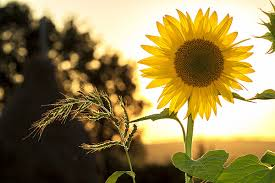

In [ ]:
cv2_imshow(im)

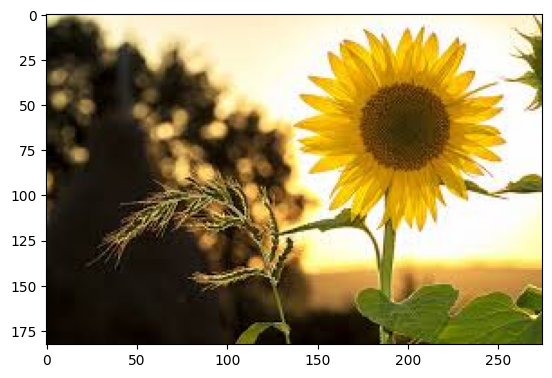

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/content/sample_data/images (2).jpeg')
plt.imshow(img)

In [ ]:
img.shape

(183, 275, 3)

In [ ]:
import cv2
resized_img = cv2.resize(img, (32, 32))
print(resized_img.shape)


(32, 32, 3)


using tensorflow

In [ ]:
import tensorflow as tf
img_tensor = tf.convert_to_tensor(img, dtype=tf.float32)
resized_img = tf.image.resize(img_tensor, (32, 32))
print(resized_img.shape)


(32, 32, 3)


In [ ]:
im2 = cv2.imread('/content/sample_data/image.jpeg')

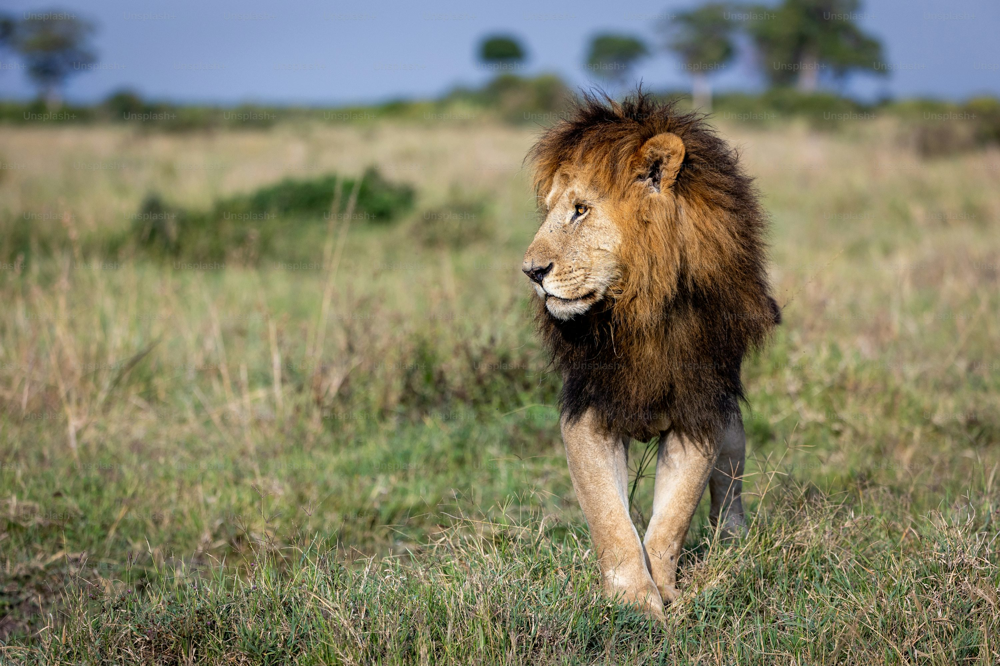

In [ ]:
cv2_imshow(im2)

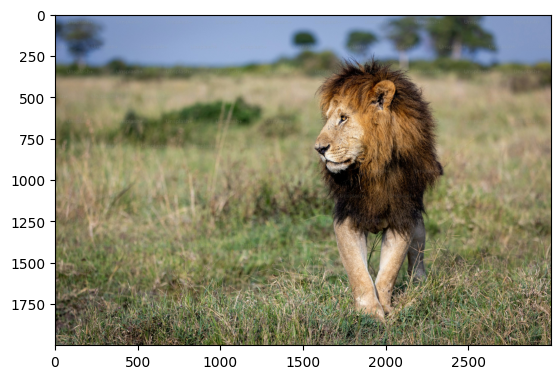

In [ ]:
img2 = mpimg.imread('/content/sample_data/image.jpeg')
plt.imshow(img2)

In [ ]:
img2.shape

(2000, 3000, 3)

In [ ]:
resized_img2 = cv2.resize(img2, (32, 32))
print(resized_img2.shape)

(32, 32, 3)


In [ ]:
predict1 = model.predict(tf.reshape(resized_img, (1, 32, 32, 3)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


In [ ]:
predict1

array([[1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 8.16515e-25, 0.00000e+00, 0.00000e+00]],
      dtype=float32)

In [ ]:
predict2 = model.predict(tf.reshape(resized_img2, (1, 32, 32, 3)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


In [ ]:
predict2

array([[0.0000000e+00, 1.0154434e-34, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 0.0000000e+00]], dtype=float32)